In [1]:
!git clone git@github.com:NitishMutha/equirectangular-toolbox.git

Cloning into 'equirectangular-toolbox'...


In [88]:
import sys
sys.path.append('equirectangular-toolbox/')

from nfov import *

In [2]:
import cv2
import matplotlib.pyplot as plt

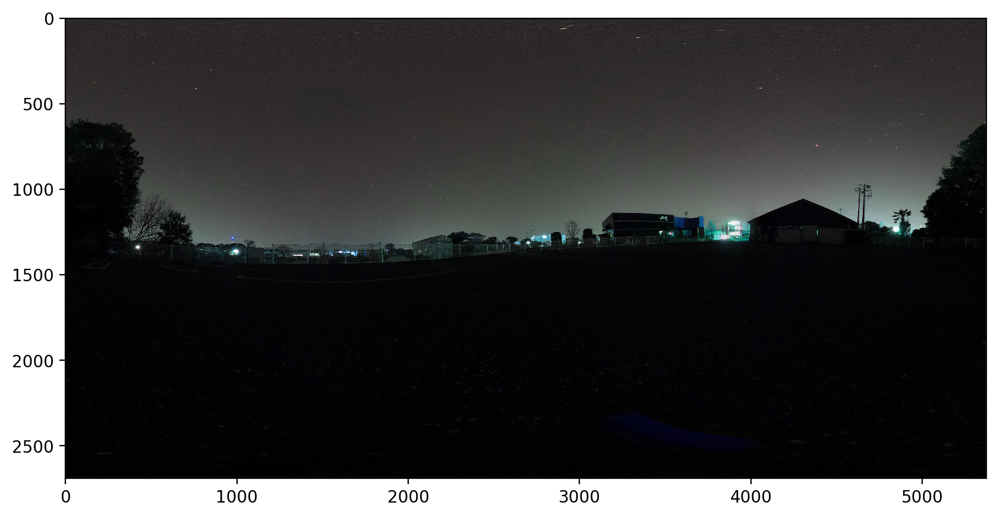

In [3]:
img1 = cv2.imread('R0010164_20191130022242.jpg')
img2 = cv2.imread('R0010165_20191130022418.jpg')
img3 = cv2.imread('R0010166_20191130022609.jpg')

%matplotlib inline
plt.figure(figsize=(10,10),dpi=200)
plt.imshow(img1)

In [4]:
nfov = NFOV(height = 500,width = 1000)

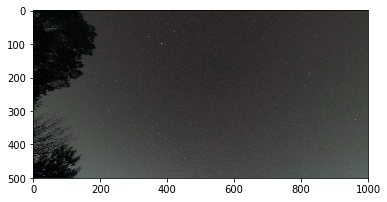

In [7]:
center_point = np.array([0.25, .25])
fovi = nfov.toNFOV(img1, center_point)

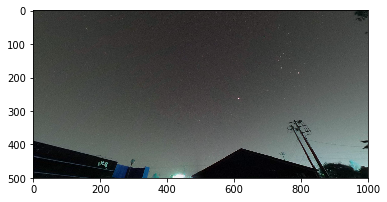

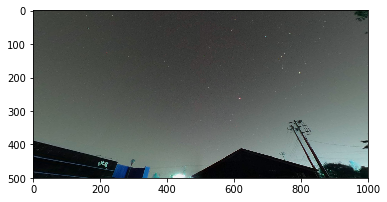

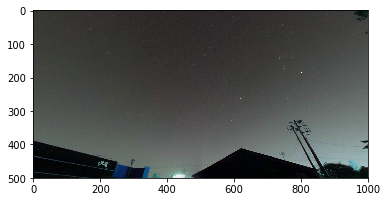

In [43]:
center_point = np.array([0.75, .25])
fovi1 = nfov.toNFOV(img1, center_point)
fovi2 = nfov.toNFOV(img2, center_point)
fovi3 = nfov.toNFOV(img3, center_point)

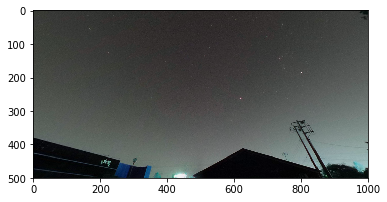

In [196]:
fovi1_c = nfov.toNFOV(img1_c, center_point)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


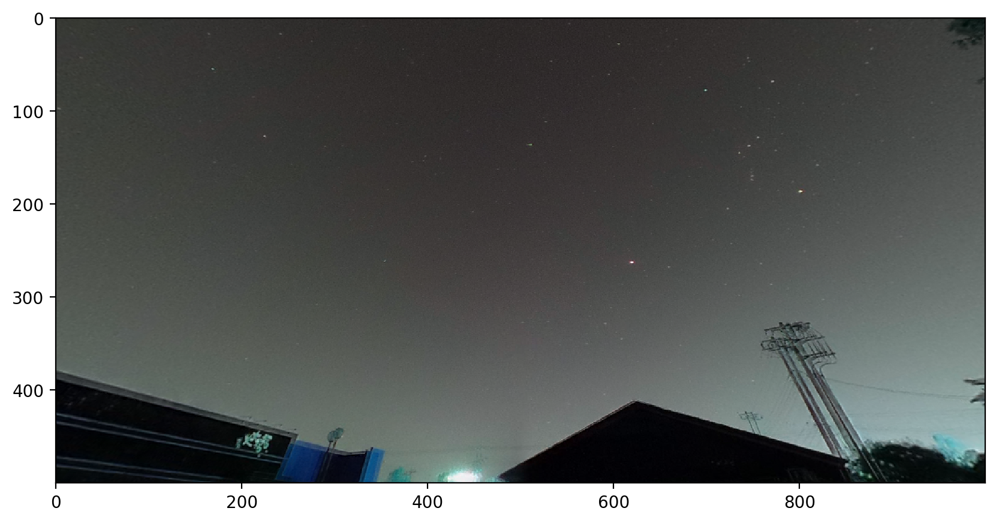

In [199]:
proc_c=merge.process([fovi3,fovi1_c])
plt.figure(figsize=(10,10),dpi=200)

plt.imshow(proc_c)

In [35]:
from PIL import Image
imlist = []

img_array = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
imlist.append(Image.fromarray(img_array))
img_array = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
imlist.append(Image.fromarray(img_array))
img_array = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
imlist.append(Image.fromarray(img_array))

imlist[0].save("loop.gif", save_all=True, append_images=imlist[1:], duration=1000,loop=1)

In [44]:
from PIL import Image
def saveasGif(images,filename='out.gif',duration=500,loop=0):
    imlist = []
    for img in images:
        img_array = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        imlist.append(Image.fromarray(img_array))
        
    imlist[0].save(filename, save_all=True, append_images=imlist[1:], duration=duration,loop=loop)
    
saveasGif([fovi1,fovi2,fovi3],filename="orion.gif",duration=1000)

## とりあえず重ねてみる

https://qiita.com/OyaDuck/items/0a5bcc885c0d6d910ed4

In [14]:
merge=cv2.createMergeMertens()
proc1 =merge.process([img1,img2,img3])
plt.figure(figsize=(10,10),dpi=200)

plt.imshow(proc1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


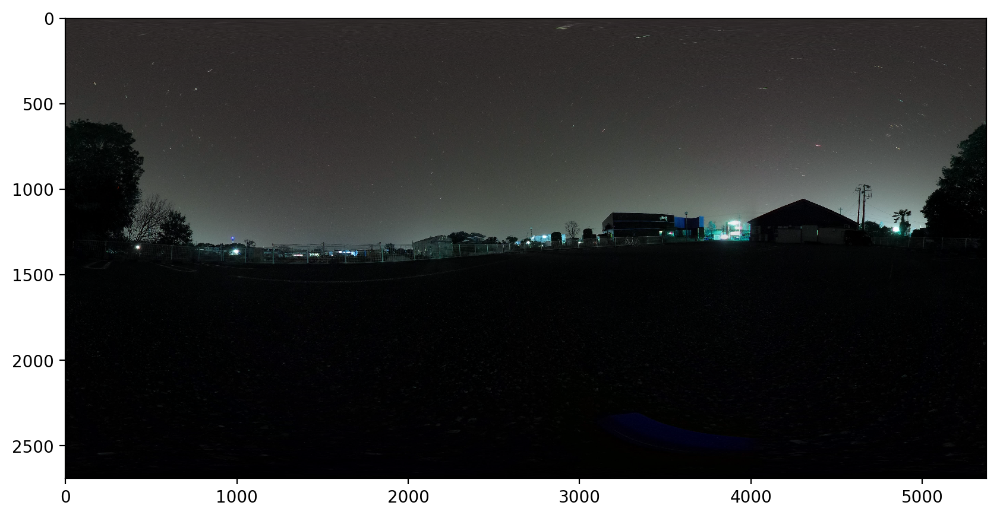

In [19]:
plt.figure(figsize=(10,10),dpi=200)

plt.imshow(proc1)

In [21]:
cv2.imwrite('mixed.png',proc1*255)

True

## 位置合わせを試みる

Let's Rotate  equirectangular Image！

Polar?1535,858


In [25]:
polarpoints=[1535,858]
hei,wid,_ = img1.shape
cx,cy = wid/2,hei/2

In [29]:
(np.array(polarpoints)-np.array([cx,cy]))/np.array([wid,hei])*2*pi

array([-1.3475656 , -1.13602234])

In [178]:
import numpy as np

def getRotation(w,polar):
    nx = np.cos(polar[1])*np.cos(polar[0])
    ny = np.cos(polar[1])*np.sin(polar[0])
    nz = np.sin(polar[1])
    #Cs = np.cos(beta)
    #Sn = np.sin(beta)
    return np.array([1,-nz*w,ny*w,  nz*w,1,-nx*w,  -ny*w,nx*w,1]).reshape(3,3)

polarw = (np.array(polarpoints)-np.array([cx,cy]))/np.array([wid/2/pi,-hei/pi])
omega = 207/16.0/180*pi
getRotation(omega,polarw)

array([[ 1.        , -0.12147166, -0.1856219 ],
       [ 0.12147166,  1.        , -0.0421388 ],
       [ 0.1856219 ,  0.0421388 ,  1.        ]])

Exif情報を切り取れれば諸々が楽に計算できるよなぁ

In [48]:
from PIL.ExifTags import TAGS
from datetime import datetime

# Exif データを取得
def get_exif_of_image(file):
    """Get EXIF of an image if exists.
    指定した画像のEXIFデータを取り出す関数
    @return exif_table Exif データを格納した辞書
    """
    im = Image.open(file)

    try:
        exif = im._getexif()
    except AttributeError:
        return {}

    exif_table = {}
    for tag_id, value in exif.items():
        tag = TAGS.get(tag_id, tag_id)
        exif_table[tag] = value
    return exif_table

def get_diff_time(file1,file2):
    """Calculate capture interval of images from  EXIF
    指定した2つの画像ファイル間の撮影時間の間隔を計算する
    """
    FMT = '%H:%M:%S'
    exif1=get_exif_of_image(file1)['DateTime']
    exif2=get_exif_of_image(file2)['DateTime']
    dtime = datetime.strptime(exif2[-8:], FMT) - datetime.strptime(exif1[-8:], FMT)
    return min(3600*24-dtime.seconds,dtime.seconds)
get_exif_of_image('R0010164_20191130022242.jpg')

{34864: 1,
 'ApertureValue': (20, 10),
 'BrightnessValue': (-58, 10),
 'ColorSpace': 1,
 'ComponentsConfiguration': b'\x01\x02\x03\x00',
 'CompressedBitsPerPixel': (320, 100),
 'Copyright': '                                             ',
 'DateTime': '2019:11:30 02:22:42',
 'DateTimeDigitized': '2019:11:30 02:22:42',
 'DateTimeOriginal': '2019:11:30 02:22:42',
 'ExifImageHeight': 2688,
 'ExifImageWidth': 5376,
 'ExifInteroperabilityOffset': 58356,
 'ExifOffset': 434,
 'ExifVersion': b'0230',
 'ExposureBiasValue': (0, 10),
 'ExposureMode': 1,
 'ExposureProgram': 1,
 'ExposureTime': (150, 10),
 'FNumber': (200, 100),
 'Flash': 0,
 'FlashPixVersion': b'0100',
 'FocalLength': (131, 100),
 'GPSInfo': {0: b'\x02\x03\x00\x00',
  1: 'N',
  2: ((35, 1), (53, 1), (5736, 100)),
  3: 'E',
  4: ((139, 1), (55, 1), (4197, 100)),
  5: b'\x00',
  6: (5579, 100),
  7: ((17, 1), (20, 1), (42, 1)),
  18: 'WGS84',
  29: '2019:11:29'},
 'ISOSpeedRatings': 200,
 'ImageDescription': '                       

このうち，必要なのは撮影時間と露光時間である。
DateTimeとExposureTimeを抽出する。

In [219]:
dt12 = datetime.strptime(exif1[-8:], FMT) - datetime.strptime(exif2[-8:], FMT)
min(dt12.seconds,3600*24-dt12.seconds)


96

In [200]:
from datetime import datetime

exif1=get_exif_of_image('R0010164_20191130022242.jpg')['DateTime']
exif2=get_exif_of_image('R0010165_20191130022418.jpg')['DateTime']
exif3=get_exif_of_image('R0010166_20191130022609.jpg')['DateTime']

FMT = '%H:%M:%S'
dt31 = datetime.strptime(exif3[-8:], FMT) - datetime.strptime(exif1[-8:], FMT)
dt31.seconds
dt21 = datetime.strptime(exif2[-8:], FMT) - datetime.strptime(exif1[-8:], FMT)
dt21.seconds


96

In [201]:
polarw = (np.array(polarpoints)-np.array([cx,cy]))/np.array([wid/2/pi,-hei/pi])
omega31 = dt31.seconds/3600/24*2*pi
omega21 = dt21.seconds/3600/24*2*pi

### 回転変換流れ

- 座標変換を施して欲しい画素の座標を得る
- その後，そのBilinear補間を得る


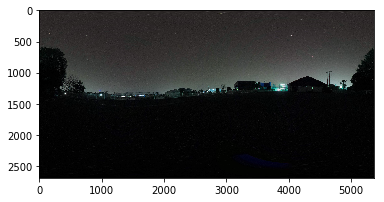

In [157]:
def _bilinear_interpolation_loop(frame, screen_coord):
    '''
    input: frame and its subpixel coordinate to be 
    '''
    frame_height,frame_width,frame_channel =frame.shape
    #uf = np.mod(screen_coord[0],1) * frame_width  # long - width
    #vf = np.mod(screen_coord[1],1) * frame_height  # lat - height

    x0 = np.floor(screen_coord[0]).astype(int)  # coord of pixel to bottom left
    y0 = np.floor(screen_coord[1]).astype(int)
    uf = screen_coord[0]  # long - width
    vf = screen_coord[1]  # lat - height
    x2 = np.add(x0, np.ones(uf.shape).astype(int))  # coords of pixel to top right
    y2 = np.add(y0, np.ones(vf.shape).astype(int))
    
    # Assume Loop 
    x2 = np.where(x2 > frame_width-1, 0, x2)
    y2 = np.where(y2 > frame_height-1, 0, y2)
    
    base_y0 = np.multiply(y0, frame_width)
    base_y2 = np.multiply(y2, frame_width)

    A_idx = np.add(base_y0, x0)
    B_idx = np.add(base_y2, x0)
    C_idx = np.add(base_y0, x2)
    D_idx = np.add(base_y2, x2)

    flat_img = np.reshape(frame, [-1, frame_channel])
    #print(flat_img.shape)
    A = np.take(flat_img, A_idx, axis=0)
    B = np.take(flat_img, B_idx, axis=0)
    C = np.take(flat_img, C_idx, axis=0)
    D = np.take(flat_img, D_idx, axis=0)
    
    wa = np.multiply(x2 - uf, y2 - vf)
    wb = np.multiply(x2 - uf, vf - y0)
    wc = np.multiply(uf - x0, y2 - vf)
    wd = np.multiply(uf - x0, vf - y0)
    #print(wa,wb,wc,wd)
    # interpolate
    AA = np.multiply(A.astype(np.float32), np.array([wa, wa, wa]).T)
    BB = np.multiply(B.astype(np.float32), np.array([wb, wb, wb]).T)
    CC = np.multiply(C.astype(np.float32), np.array([wc, wc, wc]).T)
    DD = np.multiply(D.astype(np.float32), np.array([wd, wd, wd]).T)
    out = np.reshape(np.round(AA + BB + CC + DD).astype(np.uint8), [frame_height, frame_width, 3])
    return out
img1_c=_bilinear_interpolation_loop(img1,[x_d,y_d])

plt.imshow(img1_c)

In [ ]:
def convertxy2thetaphi(img):
    ''' 
    from xy coordinate to 
    '''
    hei,wid,_ = img.shape
    cx,cy = wid/2,hei/2
    # pi > x >= -pi, pi/2 >= y > -pi/2
    xline = (np.arange(wid)-cx)*2*pi/wid
    yline = -(np.arange(hei)-cy)*pi/hei
    #Xmat= np.tile(xline,hei).reshape(hei,wid)
    #Ymat= yline.repeat(wid,axis=0).reshape(hei,wid)
    Xsline = np.tile(xline,hei)
    Ysline = yline.repeat(wid,axis=0)
    return [Xsline,Ysline]
def convertthetaphi2xy(img):
    return

def transformequirectangular():
    return

In [91]:

xline = (np.arange(wid)-cx)*2*pi/wid
yline = -(np.arange(hei)-cy)*pi/hei
Xmat= np.tile(xline,hei).reshape(hei,wid)
Ymat= yline.repeat(wid,axis=0).reshape(hei,wid)
Xsline = np.tile(xline,hei)
Ysline = yline.repeat(wid,axis=0)


In [92]:
cphi = np.cos(Xsline)
sphi = np.sin(Xsline)
cthe = np.cos(Ysline)
sthe = np.sin(Ysline)
zn =sthe
xn =cthe*cphi
yn =cthe*sphi

In [202]:
nx = np.cos(polarw[1])*np.cos(polarw[0])
ny = np.cos(polarw[1])*np.sin(polarw[0])
nz = np.sin(polarw[1])
Rrod,_ = cv2.Rodrigues(omega31*np.array([nx,ny,nz]))
Converted=np.dot(Rrod,np.concatenate((xn,yn,zn),axis=0).reshape(3,-1))
phi_d = np.arctan2(Converted[1],Converted[0])
theta_d = np.arcsin(Converted[2])
y_d = -theta_d*hei/pi+cy
x_d = phi_d*wid/2.0/pi+cx

img3_1=_bilinear_interpolation_loop(img3,[x_d,y_d])


In [203]:
Rrod,_ = cv2.Rodrigues(omega21*np.array([nx,ny,nz]))
Converted=np.dot(Rrod,np.concatenate((xn,yn,zn),axis=0).reshape(3,-1))
phi_d = np.arctan2(Converted[1],Converted[0])
theta_d = np.arcsin(Converted[2])
y_d = -theta_d*hei/pi+cy
x_d = phi_d*wid/2.0/pi+cx

img2_1=_bilinear_interpolation_loop(img2,[x_d,y_d])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


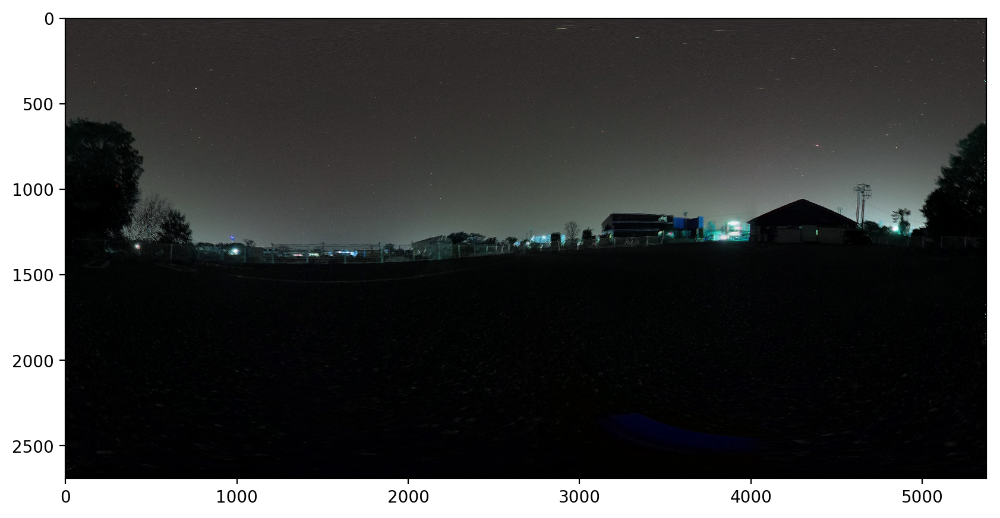

In [207]:
merge=cv2.createMergeMertens()
proc123 =merge.process([img1,img2_1,img3_1])
plt.figure(figsize=(10,10),dpi=200)

plt.imshow(proc123)

In [208]:
cv2.imwrite("processed.png",proc123*255)

True

In [189]:
nx = np.cos(polarw[1])*np.cos(polarw[0])
ny = np.cos(polarw[1])*np.sin(polarw[0])
nz = np.sin(polarw[1])
Rrod,_ = cv2.Rodrigues(omega*np.array([nx,ny,nz]))
print(Rrod)
print(R)


[[ 0.99989064 -0.00811519 -0.01236295]
 [ 0.00808042  0.99996327 -0.00285925]
 [ 0.0123857   0.00275904  0.99991949]]
[[ 1.          0.20479455 -0.09274911]
 [-0.20479455  1.         -0.02105536]
 [ 0.09274911  0.02105536  1.        ]]


Wall time: 6.1 s


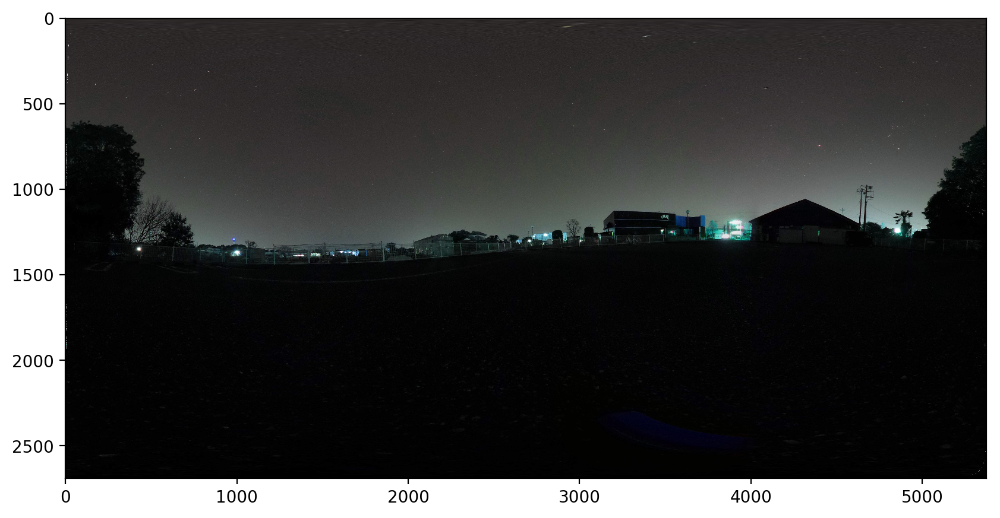

In [195]:
%%time
img1_c=_bilinear_interpolation_loop(img1,[x_d,y_d])
plt.figure(figsize=(10,10),dpi=200)
plt.imshow(img1_c)

In [236]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [243]:
%autoreload 2

3245


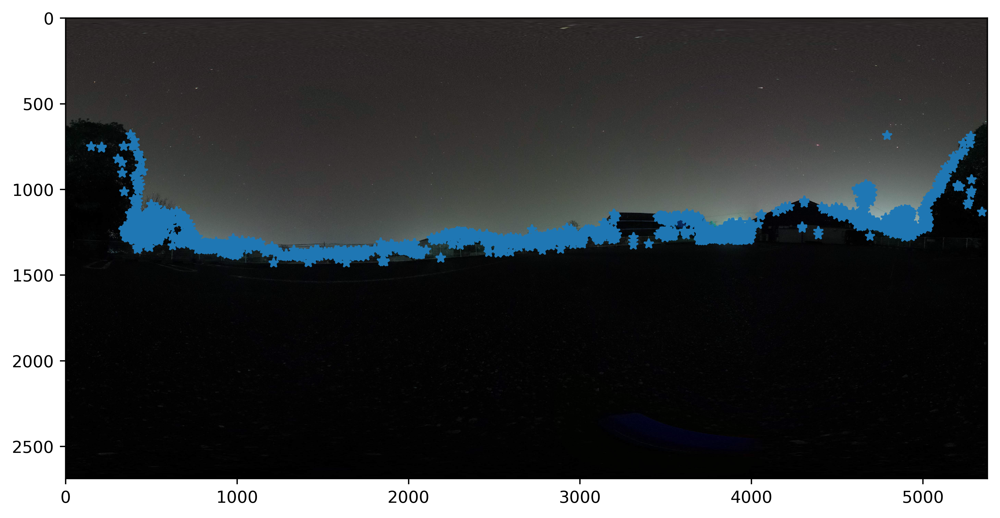

In [362]:
from TempTracker import *
temp = TempTracker(img1,'AKAZE')
pts1,pts2=temp.match(img3)
plt.figure(figsize=(10,10),dpi=500)
plt.imshow(img1)
plt.plot(pts1[:,0],pts1[:,1],'*')

In [363]:
pts2 = []
pts1 = []

for m,n in temp.matchings: 
#    if m.distance < 0.95 * n.distance:
        pts2.append(temp.kp2[m.trainIdx].pt)
        pts1.append(temp.kp1[m.queryIdx].pt)

pts1 = np.float32(pts1)
pts2 = np.float32(pts2)

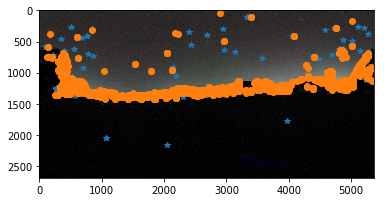

In [387]:

#plt.figure(figsize=(10,10),dpi=500)
plt.imshow(img1)
plt.plot(pts1_[:,0],pts1_[:,1],'*')
plt.plot(pts2_[:,0],pts2_[:,1],'o')


In [332]:
drawed = cv2.drawMatches(img1,temp.kp1,img3,temp.kp2,temp.matchings, None,flags=2)

TypeError: Expected cv::DMatch for argument 'matches1to2'

In [365]:
ptsdiff = pts1-pts2
ptsdiff2d=ptsdiff[:,0]*ptsdiff[:,0] + ptsdiff[:,1]*ptsdiff[:,1]

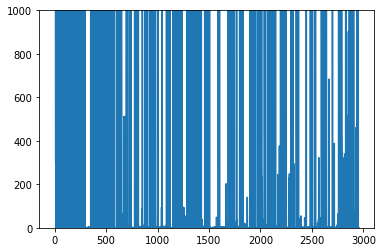

In [357]:
plt.plot(ptsdiff2d)
plt.ylim(0,1000)
pts1s=pts1[(ptsdiff2d > 1) *( ptsdiff2d <400)]
pts2s=pts2[(ptsdiff2d > 1) * (ptsdiff2d <400)]


In [379]:
pts1,pts2=temp.match(img3)
border = max(min(pts1[:,1]),min(pts2[:,1]))
border

3245


679.1376

In [372]:
border

690.9018

In [373]:
pts2_ = []
pts1_ = []

for m,n in temp.matchings: 
#    if m.distance < 0.95 * n.distance:
        pts2_.append(temp.kp2[m.trainIdx].pt)
        pts1_.append(temp.kp1[m.queryIdx].pt)

pts1_ = np.float32(pts1_)
pts2_ = np.float32(pts2_)

In [385]:
pts1_sky=pts1_[(pts1_[:,1]<border)*(pts2_[:,1]<border),:]
pts2_sky=pts2_[(pts1_[:,1]<border)*(pts2_[:,1]<border),:]

In [384]:
pts1_[:,1]<border

array([ True,  True,  True, ..., False, False, False])

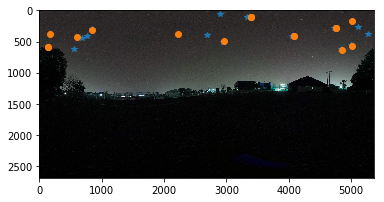

In [386]:
#plt.figure(figsize=(10,10),dpi=500)
plt.imshow(img1)
plt.plot(pts1_sky[:,0],pts1_sky[:,1],'*')
plt.plot(pts2_sky[:,0],pts2_sky[:,1],'o')


In [395]:

def EquirecTo3D(frame,pts):
    hei,wid,_ = frame.shape
    cx,cy = wid/2,hei/2
    angle=(pts - np.array([cx,cy]))/np.array([wid/2/pi,-hei/pi]).reshape(-1,2)
    cphi = np.cos(angle[:,0])
    sphi = np.sin(angle[:,0])
    cthe = np.cos(angle[:,1])
    sthe = np.sin(angle[:,1])
    zn =sthe
    xn =cthe*cphi
    yn =cthe*sphi
    return np.concatenate([xn,yn,zn]).reshape(3,-1)

pts1_sky_3d=EquirecTo3D(img1,pts1_sky)
pts2_sky_3d=EquirecTo3D(img1,pts2_sky)

In [396]:
S=np.dot(pts1_sky_3d,pts2_sky_3d.T)

In [425]:
U,W,V=np.linalg.svd(S)
Rhat_ = np.dot(V.T,U.T)
Rhat = np.linalg.multi_dot([V.T,np.diag([1,1,np.linalg.det(Rhat_)]),U.T])

In [426]:
Rhat

array([[ 0.99434951, -0.09366107,  0.04996659],
       [ 0.09054027,  0.99399567,  0.06144164],
       [-0.05542126, -0.05657047,  0.9968592 ]])

In [427]:
Rrod

array([[ 0.99989064, -0.00811519, -0.01236295],
       [ 0.00808042,  0.99996327, -0.00285925],
       [ 0.0123857 ,  0.00275904,  0.99991949]])

In [459]:
def estimate3dR(X,Y):
    S=np.dot(X,Y.T)
    U,W,V=np.linalg.svd(S)
    Rhat_ = np.dot(V.T,U.T)
    Rhat = np.linalg.multi_dot([V.T,np.diag([1,1,np.linalg.det(Rhat_)]),U.T])
    return Rhat

class RotationEstimationSVD(object):
    """
    Ex.
        re = RotationEstimationSVD()
        re = re.fit(X, y)
        y_hat = re.predict(X)
        print(re.score(X, y))
        # while X and y has datanum as row 
    """
    def __init__(self, weights=None):
        if not weights:
            self.add_weights = 0
        else:
            self.add_weights = 1        

        self.R = None

    def predict(self, X: np.ndarray):
        if self.R is None:
            raise ValueError("run .fit() before prediction")

        y_hat = np.dot(self.R,X.T)
        return y_hat.T

    def fit(self, X, y):
        self.R = self._svd_rotation_estimation(X, y)
        return self

    def _svd_rotation_estimation(self, Xt: np.ndarray, Yt: np.ndarray):
        # data reshaping
        X=Xt.T
        Y=Yt.T
        if self.add_weights:
            W = weights
        else:
            W = np.eye(X.shape[1])

        S=np.linalg.multi_dot([X,W,Y.T])
        U,_,V=np.linalg.svd(S)
        Rhat_ = np.dot(V.T,U.T)
        eyen = np.eye(X.shape[0])
        eyen[-1,-1]=np.linalg.det(Rhat_)
        Rhat = np.linalg.multi_dot([V.T,eyen,U.T])
        return Rhat

    def score(self, X, y) -> float:
        y_hat = self.predict(X)
        u = ((y - y_hat)**2).sum()
        v = ((y - y.mean())**2).sum()
        R_squared = 1 - u/v
        return R_squared
    
    def get_params(self):
        return self.R

    def set_params(self, R):
        self.R = R

In [494]:
class RANSACRegressor(object):
    """
    Ex.
        X, y = load_RM_MEDV()
        lr = LinearRegression()
        ransac = RANSACRegressor(base_estimator=lr, min_samples=10, residual_threshold=3, max_trials=10)
        ransac = ransac.fit(X, y)
        ransac.best_model.predict(X)
    """
    def __init__(self, base_estimator=None, min_samples=None,
                 residual_threshold=None, max_trials=100):

        self.base_estimator = base_estimator
        self.min_samples = min_samples
        self.residual_threshold = residual_threshold # to decide inliners
        self.max_trials = max_trials

    def fit(self, X, y):
        if self.base_estimator is None:
            raise ValueError("set .base_estimator")

        if self.min_samples is None:
            # assume linear model by default
            min_samples = X.shape[1] + 1

        if self.residual_threshold is None:
            raise ValueError("set .residual_threshold")

        if self.max_trials is None:
            raise ValueError("set .max_trials")

        model_list = []
        score_list = []
        inlier_idxs_list = []
        n_inliers_subset_list = []
        subset_index_list = []

        i_trial = 0

        sample_idxs = np.arange(X.shape[0])
        
        while i_trial < self.max_trials:
            print(i_trial, "step")

            estimator = copy.deepcopy(self.base_estimator)

            # random sampling
            subset_idxs = np.random.choice(len(X), self.min_samples, replace=False)
            X_subset = X[subset_idxs]
            y_subset = y[subset_idxs]

            # fit model to subset data
            estimator = estimator.fit(X_subset, y_subset)

            # predict all data and calc resdiuals
            y_hat = estimator.predict(X)
            residuals = self._euqulid_loss(y, y_hat)

            # calc inlier
            inlier_mask_subset = residuals < self.residual_threshold
            inlier_mask_subset = inlier_mask_subset.flatten()
            n_inliers_subset = np.sum(inlier_mask_subset)

            inlier_idxs = sample_idxs[inlier_mask_subset]
            X_inlier_subset = X[inlier_idxs]
            y_inlier_subset = y[inlier_idxs]

            # calc score of inlier data
            score_subset = estimator.score(X_inlier_subset, y_inlier_subset)

            # save models
            model_list.append(estimator)
            score_list.append(score_subset)
            inlier_idxs_list.append(inlier_idxs)

            n_inliers_subset_list.append(n_inliers_subset)
            subset_index_list.append(subset_idxs)

            i_trial += 1

        ## for debug
        # from IPython.core.debugger import Pdb; Pdb().set_trace()
        ####
        # save best model
        best_index = np.nanargmax(score_list)
        self.best_index = best_index
        self.best_model = model_list[best_index]
        self.best_inlier_idxs = inlier_idxs_list[best_index]

        # save log
        self.model_list = model_list
        self.score_list = score_list
        self.inlier_idxs_list = inlier_idxs_list
        self.n_inliers_subset_list = n_inliers_subset_list
        self.subset_index_list = subset_index_list

        return self

    def _euqulid_loss(self, y, y_hat):
        loss2 = np.sum((y - y_hat)**2,axis=1)
        return np.sqrt(loss2)

In [473]:
re = RotationEstimationSVD()
re=re.fit(pts1_sky_3d.T,pts2_sky_3d.T)
re.get_params()
re.score(pts1_sky_3d.T,pts2_sky_3d.T)

0.6742626289181455

In [537]:
import copy
re = RotationEstimationSVD()
ransac = RANSACRegressor(base_estimator=re, min_samples=4, residual_threshold=0.02, max_trials=500)
ransac = ransac.fit(pts1_sky_3d.T,pts2_sky_3d.T)

0 step
1 step
2 step
3 step
4 step
5 step
6 step
7 step
8 step
9 step
10 step
11 step
12 step
13 step
14 step
15 step
16 step
17 step
18 step
19 step
20 step
21 step
22 step
23 step
24 step
25 step
26 step
27 step
28 step
29 step
30 step
31 step
32 step
33 step
34 step
35 step
36 step
37 step
38 step
39 step
40 step
41 step
42 step
43 step
44 step
45 step
46 step
47 step
48 step
49 step
50 step
51 step
52 step
53 step
54 step
55 step
56 step
57 step
58 step
59 step
60 step
61 step
62 step
63 step
64 step
65 step
66 step
67 step
68 step
69 step
70 step
71 step
72 step
73 step
74 step
75 step
76 step
77 step
78 step
79 step
80 step
81 step
82 step
83 step
84 step
85 step
86 step
87 step
88 step
89 step
90 step
91 step
92 step
93 step
94 step
95 step
96 step
97 step
98 step
99 step
100 step
101 step
102 step
103 step
104 step
105 step
106 step
107 step
108 step
109 step
110 step
111 step
112 step
113 step
114 step
115 step
116 step
117 step
118 step
119 step
120 step
121 step
122 step
123

C:\Users\hkedw\AppData\Local\conda\conda\envs\tf35\lib\site-packages\ipykernel_launcher.py:56: RuntimeWarning: Mean of empty slice.
C:\Users\hkedw\AppData\Local\conda\conda\envs\tf35\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\hkedw\AppData\Local\conda\conda\envs\tf35\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning: invalid value encountered in double_scalars


411 step
412 step
413 step
414 step
415 step
416 step
417 step
418 step
419 step
420 step
421 step
422 step
423 step
424 step
425 step
426 step
427 step
428 step
429 step
430 step
431 step
432 step
433 step
434 step
435 step
436 step
437 step
438 step
439 step
440 step
441 step
442 step
443 step
444 step
445 step
446 step
447 step
448 step
449 step
450 step
451 step
452 step
453 step
454 step
455 step
456 step
457 step
458 step
459 step
460 step
461 step
462 step
463 step
464 step
465 step
466 step
467 step
468 step
469 step
470 step
471 step
472 step
473 step
474 step
475 step
476 step
477 step
478 step
479 step
480 step
481 step
482 step
483 step
484 step
485 step
486 step
487 step
488 step
489 step
490 step
491 step
492 step
493 step
494 step
495 step
496 step
497 step
498 step
499 step


In [546]:
listmax = np.argmax(ransac.n_inliers_subset_list)
print(listmax,ransac.best_index)
print(np.max(ransac.n_inliers_subset_list),ransac.n_inliers_subset_list[ransac.best_index])

52 160
5 5


In [538]:
ransac.best_model.get_params()

array([[ 0.99994561, -0.00305125, -0.00997291],
       [ 0.00303254,  0.99999361, -0.00189116],
       [ 0.00997862,  0.00186081,  0.99994848]])

In [497]:
Rrod

array([[ 0.99989064, -0.00811519, -0.01236295],
       [ 0.00808042,  0.99996327, -0.00285925],
       [ 0.0123857 ,  0.00275904,  0.99991949]])

In [498]:
Rest=ransac.best_model.get_params()

In [499]:
Rest.dot(Rest.T)

array([[ 1.00000000e+00, -2.57543195e-16,  4.31583875e-17],
       [-2.57543195e-16,  1.00000000e+00, -4.89943134e-16],
       [ 4.31583875e-17, -4.89943134e-16,  1.00000000e+00]])

[ -0.2625027, -0.4368636, 0.8603735 ], 0.0103961
[ 0.1770362, -0.9414102, 0.2870628 ]

In [547]:
phiest=math.atan2(-0.4368636,-0.2625027 )
phiest=math.atan2(-0.9414,0.1770 )


In [548]:
zest=math.asin(0.8603735)
zest=math.asin(0.287068)


In [549]:
print(phiest/2/pi*wid+cx,-zest/pi*hei+cy)


1503.0148416477575 1094.874627559366


In [525]:
cv2.Rodrigues(np.array([ -0.2625027, -0.4368636, 0.8603735 ])* 0.0103961)

(array([[ 0.99994968, -0.00893817, -0.0045538 ],
        [ 0.00895056,  0.99995627,  0.00270864],
        [ 0.00452939, -0.00274927,  0.99998596]]),
 array([[-2.28851369e-08, -2.27895203e-03,  4.46808727e-03,
         -2.26267910e-03,  2.72895985e-03, -9.99979514e-01,
          4.47635002e-03,  9.99979495e-01,  2.72897336e-03],
        [ 4.54159868e-03, -1.37802609e-03,  9.99975102e-01,
         -1.35094427e-03, -3.30980185e-08,  4.47634019e-03,
         -9.99975121e-01,  4.46807744e-03,  4.54162614e-03],
        [-8.94437338e-03, -9.99955328e-01, -1.35093077e-03,
          9.99955310e-01, -8.94438320e-03, -2.27892457e-03,
         -1.37801259e-03, -2.26265164e-03,  2.09257990e-08]]))

ImportError: No module named 'sklearn'